**Solar Energy EDA**

In [ ]:

%pip install pandas==1.5.3 
%pip install requests==2.31
%pip install plotly==5.24.1
%pip install seaborn==0.13.2
%pip install geopy==2.3.0 # for geographical data
%pip install kaleido==0.2.1 # for plotly image processing/export

In [ ]:
%pip install geopandas==0.13.2
%pip install fiona==1.8.20 # newer versions do not work!
%pip install scipy==1.8.0

"""" Importing Data and initial processing """"""""""""

In [2]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
import matplotlib.pyplot as plt

path = "~/dec24_bds_solar_energy/data/raw/Solar_Footprints_V2_7811899327930675815.csv"
#df = pd.read_csv(path, index_col="OBJECTID") # For time being I am keeping the data in same folder.It can readjusted later on.
#Solar dataframe
df = pd.read_csv('Solar_Footprints_V2_7811899327930675815.csv', index_col="OBJECTID")
#display(df.head())
#population dataframe
dp = pd.read_csv('Population-Density By County.csv')

In [3]:
#Constructing data frame for longitudes and latitudes of the counties
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapi")
california_counties=df.County.unique()
latitude = []
longitude = []

for county in california_counties:
    location = geolocator.geocode(f"{county}, California", timeout=5)
    latitude.append(location.latitude)
    longitude.append(location.longitude)
dgeo=pd.DataFrame({'County':df.County.unique(),'latitude':latitude,'longitude':longitude})
#coun_geo=pd.merge(df,dgeo,on='County',how='outer')
#coun_geo.head()


In [4]:
#########population data frame processing
dp=dp[(dp['GEO.display-label']=='California')]
dp=dp[['GCT_STUB.display-label','Density per square mile of land area']]
dp.rename(columns={'GCT_STUB.display-label':'County','Density per square mile of land area':'pop_density'},inplace=True)
#display(dp.head())

In [5]:
# Multiple columns have very long names in df, which can be shortened:

# From the context, GTET likely stands for Grid-Connected Transformer Equipment Terminal 
abbrev_dict = {"Distance to Substation (Miles) GTET 100 Max Voltage" : "Distance to GTET 100",
               "Percentile (GTET 100 Max Voltage)" : "Percentile (GTET 100)",
               "Substation Name GTET 100 Max Voltage" : "Substation Name GTET 100",
               "Distance to Substation (Miles) GTET 200 Max Voltage" : "Distance to GTET 200",
               "Percentile (GTET 200 Max Voltage)" : "Percentile (GTET 200)",
               "Substation Name GTET 200 Max Voltage" : "Substation Name GTET 200",
               "Distance to Substation (Miles) CAISO" : "Distance to CAISO substation"}

df.rename(abbrev_dict, axis=1, inplace = True)
#df.head()
# Multiple columns can be dropped due to their lack of informative value. 
# This applies to ID columns, the substation name columns, and the 'Shape Area' column, which represents the same information as the 'Acres' column but in square meters 
# instead of square miles.

df.drop(["HIFLD ID (GTET 100 Max Voltage)", "HIFLD ID (GTET 200 Max Voltage)", "HIFLD ID (CAISO)", "Substation Name GTET 100", "Substation Name GTET 200", 
         "Substation CASIO Name", "Shape__Area","Combined Class","Shape__Length"], axis = 1, inplace = True)############SP
#df.head()

In [6]:
#Combining dataframes: df, dp, and dgeo
df_temp=pd.merge(df,dgeo,on='County',how='outer').set_index(df.index)
df=pd.merge(df_temp,dp,on='County',how='outer')#.set_index(df_temp.index)
df=df.dropna()
df=df.set_index(df_temp.index)
df.head()

,County,Acres,Install Type,Urban or Rural,Distance to GTET 100,Percentile (GTET 100),Distance to GTET 200,Percentile (GTET 200),Distance to CAISO substation,Percentile (CAISO),Solar Technoeconomic Intersection,latitude,longitude,pop_density
OBJECTID,,,,,,,,,,,,,,
1,Alameda County,1.672639,Rooftop,Urban,0.162732,0 to 25th,2.272283,0 to 25th,2.272283,0 to 25th,Within,37.609029,-121.899142,2043.6
2,Alameda County,1.897078,Rooftop,Urban,0.226728,0 to 25th,2.392816,0 to 25th,2.392816,0 to 25th,Within,37.609029,-121.899142,2043.6
3,Alameda County,1.275783,Rooftop,Urban,0.426104,0 to 25th,2.537298,0 to 25th,2.537298,0 to 25th,Within,37.609029,-121.899142,2043.6
4,Alameda County,1.424286,Rooftop,Urban,0.491306,0 to 25th,2.626699,0 to 25th,2.626699,0 to 25th,Within,37.609029,-121.899142,2043.6
5,Alameda County,0.984429,Rooftop,Urban,0.795822,0 to 25th,2.728629,0 to 25th,2.728629,25th to 50th,Within,37.609029,-121.899142,2043.6


In [7]:
# Basic Information about the solar Data
print("\nShape:", df.shape)
print(df.info())  # Check for missing values and data types
print("\nSummary Statistics:\n")
df.describe() # Summary statistics for numerical features


Shape: (5397, 14)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 5397 entries, 1 to 5397
Data columns (total 14 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   County                             5397 non-null   object 
 1   Acres                              5397 non-null   float64
 2   Install Type                       5397 non-null   object 
 3   Urban or Rural                     5397 non-null   object 
 4   Distance to GTET 100               5397 non-null   float64
 5   Percentile (GTET 100)              5397 non-null   object 
 6   Distance to GTET 200               5397 non-null   float64
 7   Percentile (GTET 200)              5397 non-null   object 
 8   Distance to CAISO substation       5397 non-null   float64
 9   Percentile (CAISO)                 5397 non-null   object 
 10  Solar Technoeconomic Intersection  5397 non-null   object 
 11  latitude                           53

,Acres,Distance to GTET 100,Distance to GTET 200,Distance to CAISO substation,latitude,longitude,pop_density
count,5397.000000,5397.000000,5397.000000,5397.000000,5397.000000,5397.000000,5397.000000
mean,27.839660,4.875213,9.005963,6.488376,36.033689,-119.465417,887.775913
std,185.731791,5.598614,8.956602,5.257426,1.860967,2.021324,1261.604301
min,0.000413,0.000000,0.000000,0.000000,32.963784,-123.899773,1.800000
25%,0.935973,1.364023,3.117734,2.655241,34.315507,-121.298071,103.300000
50%,2.098715,2.766023,6.142767,5.061011,36.223108,-119.773799,307.100000
75%,4.775675,6.182651,11.999466,8.782869,37.550087,-118.209681,1465.200000
max,7438.603255,55.746475,102.224911,60.378808,40.796512,-115.359567,17179.200000


In [8]:
print("\nMissing Values:\n", df.isnull().sum())
# Calculate the percentage of missing values for each column
missing_percentage = (df.isnull().sum() / df.shape[0]) * 100

# Print the missing values along with the percentage
print("\nMissing Values (Percentage):\n", missing_percentage)


Missing Values:
 County                               0
Acres                                0
Install Type                         0
Urban or Rural                       0
Distance to GTET 100                 0
Percentile (GTET 100)                0
Distance to GTET 200                 0
Percentile (GTET 200)                0
Distance to CAISO substation         0
Percentile (CAISO)                   0
Solar Technoeconomic Intersection    0
latitude                             0
longitude                            0
pop_density                          0
dtype: int64

Missing Values (Percentage):
 County                               0.0
Acres                                0.0
Install Type                         0.0
Urban or Rural                       0.0
Distance to GTET 100                 0.0
Percentile (GTET 100)                0.0
Distance to GTET 200                 0.0
Percentile (GTET 200)                0.0
Distance to CAISO substation         0.0
Percentile (CAISO)     

In [9]:
print("There is", df.duplicated().sum() ,"duplicated data in the dataset.")

There is 0 duplicated data in the dataset.


In [10]:
# Getting the modes of relevant categorical columns:
print(df["Install Type"].unique())
print(df["Urban or Rural"].unique())
#print(df["Combined Class"].unique())
print(df["Solar Technoeconomic Intersection"].unique())

['Rooftop' 'Parking' 'Ground']
['Urban' 'Rural']
['Within' 'Outside']


""""""""""""Data Mining""""""""""""""

1. Boxplot_distance of solar installations from substations

In [11]:
# Create a boxplot matrix

def plot_boxplot_matrix():

    # Reshape the DataFrame from wide to long format in order to plot it clean
    df_with_index = df.reset_index()
    #print(df_with_index)
    df_long = df_with_index.melt(
        id_vars=["OBJECTID", "Install Type"],  # Keep 'Install Type' as the identifier
        value_vars=[
            'Distance to GTET 100',
            'Distance to GTET 200',
            'Distance to CAISO substation'
        ],  # Columns to melt
        var_name='Substation Type',  # New column for substation types
        value_name='Distance'  # New column for distance values
    )

    #print(df_long)

    fig = px.box(
        df_long,
        x='Install Type',  # X-axis: Install Type
        y='Distance',  # Y-axis: Distance
        color='Substation Type',  # Color by substation type
        facet_col='Substation Type',  # Create subplots for each substation type
        title='Boxplot: Distance to Substations by Install Type and Substation Type',
        labels={'Distance': 'Distance to Substation (Miles)', 'Install Type': 'Install Type'},  # Customize axis labels
        width=1200,
        height=700,
        facet_col_spacing=0.05  # Reduce spacing between subplots
    )

    # Update layout for better readability
    fig.update_layout(
        xaxis_title='Install Type',  # X-axis label
        yaxis_title='Distance to Substation (Miles)',  # Y-axis label
        showlegend=False,  # Show legend to differentiate substation types
        font=dict(size=12),  # Adjust font size for better readability
        boxmode='group',  # Group boxplots by install type
        #margin=dict(l=50, r=50, t=80, b=50),  # Adjust margins to prevent overlap

    )

    # Adjust facet column spacing and titles
    fig.update_xaxes(matches=None, showticklabels=True)  # Ensure x-axis labels are shown for each subplot
    fig.update_yaxes(matches=None, showticklabels=True)  # Ensure y-axis labels are shown for each subplot
    fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))  # Clean up facet titles


    # Show the figure
    fig.show()
   
    # Save the figure as a PNG file (ONCE!)
    #pio.write_json(fig, "/home/ubuntu/dec24_bds_solar_energy/data/processed/Boxplotmatrix.json")
    fig.write_image("/home/ubuntu/dec24_bds_solar_energy/reports/figures/Boxplotmatrix.png")

print("Boxplot matrix")
plot_boxplot_matrix()

Boxplot matrix


2. Geographical distribution of solar panels

Geolocator

In [12]:
#California Map initiator
import geopandas as gpd
url = "https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json"
states = gpd.read_file(url)
california = states[states['name'] == 'California']

In [13]:
#Geographical plot of Total solar installations per coounty
total_solar=df[['County' ,'Urban or Rural','latitude','longitude']].value_counts().reset_index()
#total_solar.head()
total_solar.columns=['County' ,'Urban or Rural','latitude','longitude','frequency']
total_solar_rural=total_solar[total_solar['Urban or Rural']!='Urban']
total_solar_urban=total_solar[total_solar['Urban or Rural']!='Rural']
#total_solar_rural.head()

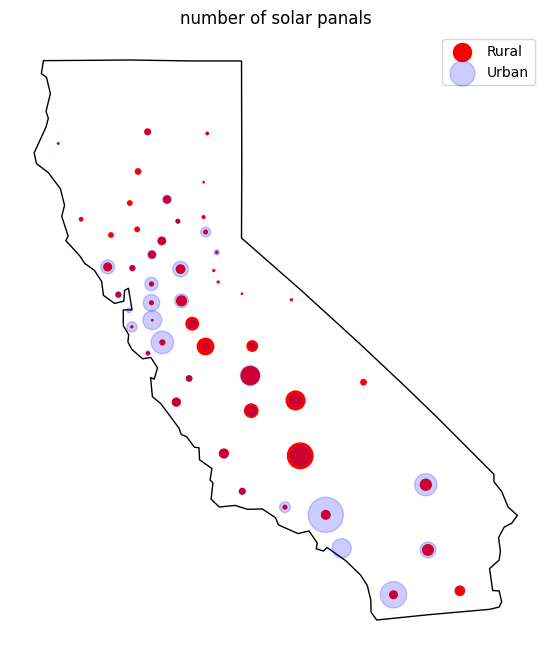

In [14]:
#### Plot
california.plot(edgecolor='black', facecolor='none', figsize=(8, 8))
plt.title("number of solar panals")
plt.scatter(total_solar_rural.longitude,total_solar_rural.latitude,s=total_solar_rural.frequency,c='r',label='Rural')
plt.scatter(total_solar_urban.longitude,total_solar_urban.latitude,s=total_solar_urban.frequency,c='b',label='Urban',alpha=0.2)
plt.axis('off')
plt.legend();

3. Solar panels number versus population distribution

In [15]:
solar_area=df.groupby('County')['Acres'].sum()
solar_area_df=pd.merge(solar_area,df.drop('Acres',axis=1),on=['County'],how='outer')
#solar_area_df.info()

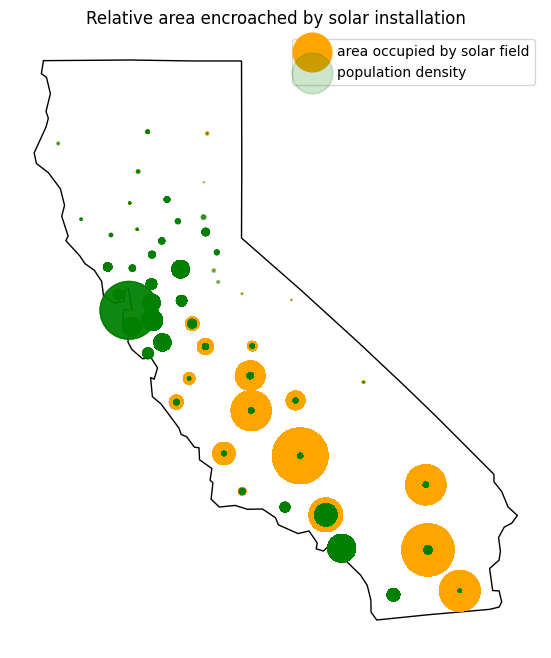

In [16]:
#plot
california.plot(edgecolor='black', facecolor='none', figsize=(8, 8))
plt.title("Relative area encroached by solar installation")
plt.scatter(solar_area_df.longitude,solar_area_df.latitude,s=solar_area_df.Acres/20,c='orange',label='area occupied by solar field')
plt.scatter(solar_area_df.longitude,solar_area_df.latitude,s=solar_area_df.pop_density/10,c='green',label='population density',alpha=0.2)
#plt.text(solar_area_df.longitude,solar_area_df.latitude,solar_area_df.County,fontsize=12, ha='right', va='bottom')
plt.legend()
plt.axis('off');

""""""""""""""" Machine Learning """""""""""""""

In [17]:
df['Percentile (GTET 100)'].unique()

array(['0 to 25th', '25th to 50th', '50th to 75th', '75th to 100th'],
      dtype=object)

In [18]:
# Changing the categorical variable to binary in order to be able to handle it better later
df["Solar Technoeconomic Intersection"] = df["Solar Technoeconomic Intersection"].apply(lambda x: 1 if x == "Within" else 0)
df.head()

,County,Acres,Install Type,Urban or Rural,Distance to GTET 100,Percentile (GTET 100),Distance to GTET 200,Percentile (GTET 200),Distance to CAISO substation,Percentile (CAISO),Solar Technoeconomic Intersection,latitude,longitude,pop_density
OBJECTID,,,,,,,,,,,,,,
1,Alameda County,1.672639,Rooftop,Urban,0.162732,0 to 25th,2.272283,0 to 25th,2.272283,0 to 25th,1,37.609029,-121.899142,2043.6
2,Alameda County,1.897078,Rooftop,Urban,0.226728,0 to 25th,2.392816,0 to 25th,2.392816,0 to 25th,1,37.609029,-121.899142,2043.6
3,Alameda County,1.275783,Rooftop,Urban,0.426104,0 to 25th,2.537298,0 to 25th,2.537298,0 to 25th,1,37.609029,-121.899142,2043.6
4,Alameda County,1.424286,Rooftop,Urban,0.491306,0 to 25th,2.626699,0 to 25th,2.626699,0 to 25th,1,37.609029,-121.899142,2043.6
5,Alameda County,0.984429,Rooftop,Urban,0.795822,0 to 25th,2.728629,0 to 25th,2.728629,25th to 50th,1,37.609029,-121.899142,2043.6


In [19]:
# Separating numerical and categorical columns for plotting

numerical_cols = df.select_dtypes(include=['number']).columns  # Get numerical columns
#numerical_cols = numerical_cols.drop(df.filter(like='Solar Technoeconomic Intersection').columns)  # Drop "Solar Technoeconomic Intersection" from numerical_cols because it is binary?
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
categorical_cols = categorical_cols.drop(df.filter(like='Percentile').columns)  # Drop percentile columns from categorical_cols

print(numerical_cols, categorical_cols )

# Calculate the correlation coefficients
corr = df[numerical_cols].corr()
print(corr)

Index(['Acres', 'Distance to GTET 100', 'Distance to GTET 200',
       'Distance to CAISO substation', 'Solar Technoeconomic Intersection',
       'latitude', 'longitude', 'pop_density'],
      dtype='object') Index(['County', 'Install Type', 'Urban or Rural'], dtype='object')
                                      Acres  Distance to GTET 100  \
Acres                              1.000000              0.031897   
Distance to GTET 100               0.031897              1.000000   
Distance to GTET 200               0.006064              0.701609   
Distance to CAISO substation      -0.018616              0.185021   
Solar Technoeconomic Intersection -0.199216             -0.195337   
latitude                          -0.083660             -0.162187   
longitude                          0.109477              0.152529   
pop_density                       -0.062421             -0.077771   

                                   Distance to GTET 200  \
Acres                                    

In [20]:
# Create correlation Heatmap (for numerical features)

def plot_correlation_heatmap(numerical_cols):
    # Use mask to cover redundant values
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    corr_masked = corr.mask(mask)
    #print(mask, corr.values, corr_masked.values)
    
    # Flip the correlation matrix and the mask vertically
    corr_flipped = np.flip(corr_masked.values, axis=0)
    mask_flipped = np.flip(mask, axis=0)

    # Create text for the heatmap tiles
    text_values = np.where(mask_flipped, "", np.around(corr_flipped, 2))  # Set text to empty string for masked tiles

    #print(text_values) # this will be flipped in go.Heatmap() automatically

    fig = go.Figure(data=go.Heatmap(
        x=corr.columns, 
        y=corr.columns[::-1],
        z=np.flip(corr_masked.values, axis=0),  # Flip the correlation matrix vertically  # Apply mask to hide upper triangle
        colorscale='RdBu', zmin=-1, zmax=1,
        colorbar=dict(title='Correlation Coefficient'),
        text = text_values,
        texttemplate='%{text:.2f}',  # Format text to 2 decimal places
        hovertemplate=(
            '<b>X</b>: %{x}<br>'  # Feature name on the x-axis
            '<b>Y</b>: %{y}<br>'  # Feature name on the y-axis
            '<b>Correlation</b>: %{z:.2f}<br>'  # Correlation value (formatted to 2 decimal places)
            '<extra></extra>'  # Remove the extra hover info
        )
    )
    )
    
    fig.update_layout(
        title="Correlation Heatmap",
        height=700, width=1100,
        xaxis=dict(
            title='Features',
            #tickangle=-45,
            showgrid=False  # Remove x-axis grid lines
        ),
        yaxis=dict(
            title='Features',
            showgrid=False  # Remove y-axis grid lines
        )    
    )

    fig.show()
    
    # Save the figure as a PNG file (ONCE!)
    #pio.write_json(fig, "/home/ubuntu/dec24_bds_solar_energy/data/processed/Heatmap.json")
    fig.write_image("/home/ubuntu/dec24_bds_solar_energy/reports/figures/Heatmap.png")
    
print("Correlation heatmap for numerical features")
plot_correlation_heatmap(numerical_cols)


Correlation heatmap for numerical features


In [21]:
# Statistical tests

# On basis of the previous findings some relationships could be further examined by statstical tests:
# 1. Relationship between pop_density (continous, non-normal distributed variable) and the target variable (binary variable) -> Point-Biserial Correlation
# 2. Relationship between Distance GTET 200 (continous, non-normal distributed variable) and the target variable (binary variable) -> Point-Biserial Correlation

# Since they were not included in the correlation analysis (because they are categorical features), additional relationships could be explored:
# 3. Relationship between Install Type (categorical variable) and the target variable (binary variable) -> Chi-Square Test of Independence
# 4. Relationship between "Urban and Rural" (categorical variable) and the target variable (binary variable) -> Chi-Square Test of Independence

import scipy.stats as stats

In [22]:
# 1. Point-Biserial Correlation
from scipy.stats import pointbiserialr

# check the normality of 'pop_density'

# Shapiro-Wilk test for normality
shapiro_pop_density = stats.shapiro(df['pop_density'])

# Print Shapiro-Wilk test result
print(f"Shapiro-Wilk test for Pop Density: Statistic={shapiro_pop_density.statistic}, p-value={shapiro_pop_density.pvalue}")

# If the p-value < 0.05, the data is not normally distributed
if shapiro_pop_density.pvalue < 0.05:
    print("Pop Density is NOT normally distributed (reject the null hypothesis). Proceeding with non-parametric methods.")
else:
    print("Pop Density is normally distributed (fail to reject the null hypothesis).")

# Perform Point-Biserial Correlation between 'pop_density' and the binary target variable 'Solar Technoeconomic Intersection'
corr_pop_density, p_value = stats.pointbiserialr(df['pop_density'], df['Solar Technoeconomic Intersection'])

# Print the results
print(f"\nPoint-Biserial Correlation between Pop Density and Solar Technoeconomic Intersection: {corr_pop_density}")
print(f"p-value: {p_value}")

# Interpret the correlation result
if p_value < 0.05:
    print("There is a significant relationship between Pop Density and Solar Technoeconomic Intersection.")
else:
    print("There is no significant relationship between Pop Density and Solar Technoeconomic Intersection.")


Shapiro-Wilk test for Pop Density: Statistic=0.5980127453804016, p-value=0.0
Pop Density is NOT normally distributed (reject the null hypothesis). Proceeding with non-parametric methods.

Point-Biserial Correlation between Pop Density and Solar Technoeconomic Intersection: 0.2747224750762425
p-value: 4.6225274581090477e-94
There is a significant relationship between Pop Density and Solar Technoeconomic Intersection.


/home/ubuntu/dec24_bds_solar_energy/solar_venv/lib/python3.8/site-packages/scipy/stats/_morestats.py:1761: UserWarning:

p-value may not be accurate for N > 5000.



In [23]:
# 2. Point-Biserial Correlation
from scipy.stats import pointbiserialr

# check the normality of 'Distance to GTET 200'

# Shapiro-Wilk test for normality
shapiro_Distance_GTET_200 = stats.shapiro(df['Distance to GTET 200'])

# Print Shapiro-Wilk test result
print(f"Shapiro-Wilk test for Distance to GTET 200: Statistic={shapiro_Distance_GTET_200.statistic}, p-value={shapiro_Distance_GTET_200.pvalue}")

# If the p-value < 0.05, the data is not normally distributed
if shapiro_Distance_GTET_200.pvalue < 0.05:
    print("Distance to GTET 200 is NOT normally distributed (reject the null hypothesis). Proceeding with non-parametric methods.")
else:
    print("Distance to GTET 200 is normally distributed (fail to reject the null hypothesis).")

# Perform Point-Biserial Correlation between 'Distance to GTET 200' and the binary target variable 'Solar Technoeconomic Intersection'
corr_Distance_GTET_200, p_value = stats.pointbiserialr(df['Distance to GTET 200'], df['Solar Technoeconomic Intersection'])

# Print the results
print(f"\nPoint-Biserial Correlation between Distance to GTET 200 and Solar Technoeconomic Intersection: {corr_Distance_GTET_200}")
print(f"p-value: {p_value}")

# Interpret the correlation result
if p_value < 0.05:
    print("There is a significant relationship between Distance to GTET 200 and Solar Technoeconomic Intersection.")
else:
    print("There is no significant relationship between Distance to GTET 200 and Solar Technoeconomic Intersection.")


Shapiro-Wilk test for Distance to GTET 200: Statistic=0.7807221412658691, p-value=0.0
Distance to GTET 200 is NOT normally distributed (reject the null hypothesis). Proceeding with non-parametric methods.

Point-Biserial Correlation between Distance to GTET 200 and Solar Technoeconomic Intersection: -0.26706179695122445
p-value: 8.40482629222274e-89
There is a significant relationship between Distance to GTET 200 and Solar Technoeconomic Intersection.


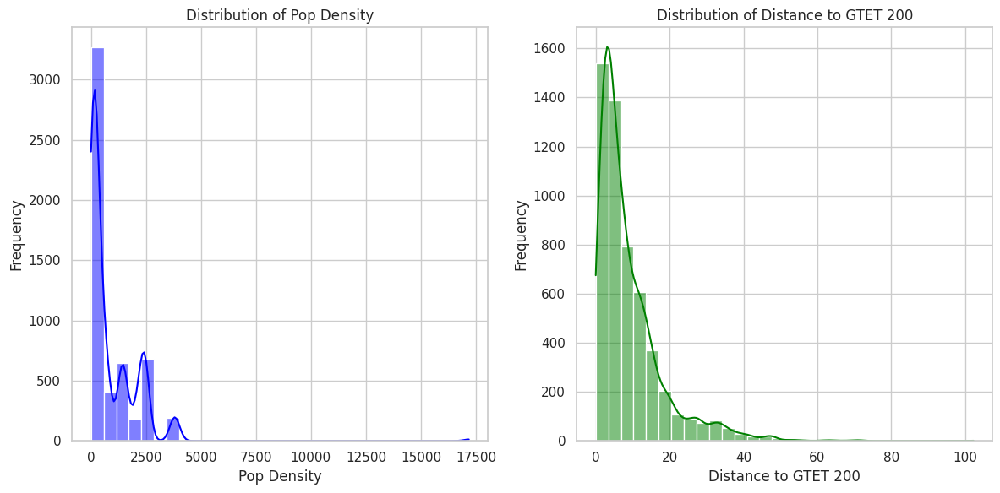

Shapiro-Wilk test for Pop Density: Statistic=0.5980127453804016, p-value=0.0
Shapiro-Wilk test for Distance to GTET 200: Statistic=0.7807221412658691, p-value=0.0
Pop Density is NOT normally distributed (reject the null hypothesis).
Distance to GTET 200 is NOT normally distributed (reject the null hypothesis).


/home/ubuntu/dec24_bds_solar_energy/solar_venv/lib/python3.8/site-packages/scipy/stats/_morestats.py:1761: UserWarning:

p-value may not be accurate for N > 5000.



In [24]:
# Testing whether pop_density and Distance to GTET 200 are normally distributed
# visualize the distributions

# Set up the plot style
sns.set(style="whitegrid")

# Plot histograms for both variables
plt.figure(figsize=(12, 6))

# Pop Density
plt.subplot(1, 2, 1)
sns.histplot(df['pop_density'], kde=True, color='blue', bins=30)
plt.title('Distribution of Pop Density')
plt.xlabel('Pop Density')
plt.ylabel('Frequency')

# Distance to GTET 200
plt.subplot(1, 2, 2)
sns.histplot(df['Distance to GTET 200'], kde=True, color='green', bins=30)
plt.title('Distribution of Distance to GTET 200')
plt.xlabel('Distance to GTET 200')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Now, perform the Shapiro-Wilk normality test
# Null hypothesis: the data follows a normal distribution

shapiro_pop_density = stats.shapiro(df['pop_density'])
shapiro_distance_gtet_200 = stats.shapiro(df['Distance to GTET 200'])

# Print the results
print(f"Shapiro-Wilk test for Pop Density: Statistic={shapiro_pop_density.statistic}, p-value={shapiro_pop_density.pvalue}")
print(f"Shapiro-Wilk test for Distance to GTET 200: Statistic={shapiro_distance_gtet_200.statistic}, p-value={shapiro_distance_gtet_200.pvalue}")

# Interpret the p-values
if shapiro_pop_density.pvalue < 0.05:
    print("Pop Density is NOT normally distributed (reject the null hypothesis).")
else:
    print("Pop Density is normally distributed (fail to reject the null hypothesis).")

if shapiro_distance_gtet_200.pvalue < 0.05:
    print("Distance to GTET 200 is NOT normally distributed (reject the null hypothesis).")
else:
    print("Distance to GTET 200 is normally distributed (fail to reject the null hypothesis).")


In [27]:
# Create the subplot grid (1 row and 2 columns)
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Pop Density vs STI", 
                    "Distance to GTET 200 vs STI",
                    "Install Type vs STI", 
                    "Urban or Rural vs STI"),
    #shared_yaxes=True,  # Optional: to share y-axis for comparison
    vertical_spacing=0.1, horizontal_spacing=0.1
)

# 1. Violin plot for Pop Density vs Solar Technoeconomic Intersection
violin1 = px.violin(df, y="pop_density", x="Solar Technoeconomic Intersection", box=True, hover_data=df.columns).data[0]
fig.add_trace(violin1, row=1, col=1)

# 2. Violin plot for Distance to GTET 200 vs Solar Technoeconomic Intersection
violin2 = px.violin(df, y="Distance to GTET 200", x="Solar Technoeconomic Intersection", box=True, hover_data=df.columns).data[0]
fig.add_trace(violin2, row=1, col=2)

# Update layout for better spacing and labels
fig.update_layout(
    height=800, 
    width=1300, 
    title_text="Violin and Bar Plots of Variables vs Solar Technoeconomic Intersection",
    showlegend=False,
    title_x=0.5  # Centering the title
)

fig.show()


In [28]:
# 3. Chi-Square Test (for Categorical Variables)
from scipy.stats import chi2_contingency

# Create contingency table
contingency_table = pd.crosstab(df['Install Type'], df['Solar Technoeconomic Intersection'])

# Perform the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square statistic: {chi2}, p-value: {p}")


# 4.
# Create contingency table
contingency_table = pd.crosstab(df['Urban or Rural'], df['Solar Technoeconomic Intersection'])

# Perform the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square statistic: {chi2}, p-value: {p}")

Chi-Square statistic: 2475.1677082088527, p-value: 0.0
Chi-Square statistic: 2817.6208650475164, p-value: 0.0
